## Starter EDA
This notebook is our first pass through the data sets and initial EDA. This EDA influenced a number of decisions we made throughout the project we are documented in the final report. More formal EDA projects can be found in the EDA Projects notebook.

In [0]:
import pyspark
from pyspark.sql.functions import col, concat, lit, regexp_replace, when, length, lpad, to_timestamp, max, mean, stddev
from pyspark.sql.types import StringType, BooleanType
import pyspark.sql.functions as F

# OHE Encoding, Scaler
from pyspark.ml import Pipeline
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler, StandardScaler

#### Create the Azure BLOB storage to store data for quick access when datasets are huge

In [0]:
blob_container = "w261-scrr" # The name of your container created in https://portal.azure.com
storage_account = "midsw261rv" # The name of your Storage account created in https://portal.azure.com
secret_scope = "w261scrr" # The name of the scope created in your local computer using the Databricks CLI
secret_key = "w261scrrkey" # The name of the secret key created in your local computer using the Databricks CLI 
blob_url = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"
mount_path = "/mnt/mids-w261"


#### Import external airport codes data

In [0]:
# import airport codes, map ident on iata code to origin and neighbor_call
airport_codes = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/airport_codes_csv.csv")
codes_cols = ['ident', 'name', 'elevation_ft', 'iata_code', 'coordinates']
airport_codes = airport_codes.select(*codes_cols).filter(airport_codes.iata_code != 'null')
display(airport_codes)

ident,name,elevation_ft,iata_code,coordinates
03N,Utirik Airport,4,UTK,"169.852005, 11.222"
07FA,Ocean Reef Club Airport,8,OCA,"-80.274803161621, 25.325399398804"
0AK,Pilot Station Airport,305,PQS,"-162.899994, 61.934601"
0CO2,Crested Butte Airpark,8980,CSE,"-106.928341, 38.851918"
0TE7,LBJ Ranch Airport,1515,JCY,"-98.62249755859999, 30.251800537100003"
13MA,Metropolitan Airport,418,PMX,"-72.31140136719999, 42.223300933800004"
13Z,Loring Seaplane Base,0,WLR,"-131.636993408, 55.6012992859"
16A,Nunapitchuk Airport,12,NUP,"-162.440454, 60.905591"
16K,Port Alice Seaplane Base,0,PTC,"-133.597, 55.803"
19AK,Icy Bay Airport,50,ICY,"-141.662002563, 59.96900177"


In [0]:
# Inspect the Mount's Final Project folder 
display(dbutils.fs.ls("/mnt/mids-w261/datasets_final_project"))

path,name,size
dbfs:/mnt/mids-w261/datasets_final_project/airlines/,airlines/,0
dbfs:/mnt/mids-w261/datasets_final_project/airlines_data/,airlines_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data/,parquet_airlines_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data_3m/,parquet_airlines_data_3m/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data_6m/,parquet_airlines_data_6m/,0
dbfs:/mnt/mids-w261/datasets_final_project/stations_data/,stations_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/,weather_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data_6_hr/,weather_data_6_hr/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data_single/,weather_data_single/,0


### Load Q1 flights data

In [0]:
# Load 2015 Q1 for Flights
df_airlines = spark.read.parquet("/mnt/mids-w261/datasets_final_project/parquet_airlines_data_3m/")
display(df_airlines)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM
2015,1,2,1,7,2015-02-01,AA,19805,AA,N3MEAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,749,19.0,19.0,1.0,1,0700-0759,34.0,823,1056,4.0,1030,1100,30.0,30.0,1.0,2,1000-1059,0.0,null,0.0,120.0,131.0,93.0,1.0,733.0,3,0.0,19.0,11.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,2,1,2015-02-02,AA,19805,AA,N3LPAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,null,null,null,null,null,0700-0759,null,null,null,null,1030,null,null,null,null,null,1000-1059,1.0,B,0.0,120.0,null,null,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,3,2,2015-02-03,AA,19805,AA,N3LXAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,735,5.0,5.0,0.0,0,0700-0759,19.0,754,1027,9.0,1030,1036,6.0,6.0,0.0,0,1000-1059,0.0,null,0.0,120.0,121.0,93.0,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,4,3,2015-02-04,AA,19805,AA,N3LHAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,727,-3.0,0.0,0.0,-1,0700-0759,11.0,738,1008,5.0,1030,1013,-17.0,0.0,0.0,-2,1000-1059,0.0,null,0.0,120.0,106.0,90.0,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,5,4,2015-02-05,AA,19805,AA,N3LYAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,757,27.0,27.0,1.0,1,0700-0759,23.0,

### Let's summarize the airlines data

In [0]:
dbutils.data.summarize(df_airlines)

<!DOCTYPE html>

##### We see many DIV columns are over 95% empty. We'll use select command to choose only the columns we want to move forward with.

In [0]:
selected_cols = ["ACTUAL_ELAPSED_TIME","AIR_TIME","ARR_DEL15","ARR_DELAY","ARR_DELAY_GROUP","ARR_DELAY_NEW","ARR_TIME",
                 "ARR_TIME_BLK","CANCELLATION_CODE","CANCELLED","CARRIER_DELAY","CRS_ARR_TIME","CRS_DEP_TIME",
                 "CRS_ELAPSED_TIME","DAY_OF_MONTH","DAY_OF_WEEK","DEP_DEL15","DEP_DELAY","DEP_DELAY_GROUP",
                 "DEP_DELAY_NEW","DEP_TIME","DEP_TIME_BLK","DEST","DEST_AIRPORT_ID","DEST_AIRPORT_SEQ_ID",
                 "DEST_CITY_MARKET_ID","DEST_CITY_NAME","DEST_STATE_ABR","DEST_STATE_FIPS","DEST_STATE_NM","DEST_WAC",
                 "DISTANCE","DISTANCE_GROUP","DIVERTED","FIRST_DEP_TIME","FL_DATE","LATE_AIRCRAFT_DELAY","LONGEST_ADD_GTIME",
                 "MONTH","NAS_DELAY","OP_CARRIER","OP_CARRIER_AIRLINE_ID","OP_CARRIER_FL_NUM","OP_UNIQUE_CARRIER",
                 "ORIGIN","ORIGIN_AIRPORT_ID","ORIGIN_AIRPORT_SEQ_ID","ORIGIN_CITY_MARKET_ID","ORIGIN_CITY_NAME",
                 "ORIGIN_STATE_ABR","ORIGIN_STATE_FIPS","ORIGIN_STATE_NM","ORIGIN_WAC","QUARTER","SECURITY_DELAY",
                 "TAIL_NUM","TAXI_IN","TAXI_OUT","TOTAL_ADD_GTIME","WEATHER_DELAY","WHEELS_OFF","WHEELS_ON","YEAR"]
df_temp = df_airlines.select(*selected_cols)

##### We also saw that many columns which contains categorical data were being treated as numeric since they contain digit values. Let's change them to categorical by using StringType. Also change the ones with 0 or 1 values to boolean

In [0]:
df_temp = df_temp.withColumn("DEST_CITY_MARKET_ID",col("DEST_CITY_MARKET_ID").cast(StringType())) \
        .withColumn("OP_CARRIER_AIRLINE_ID",col("OP_CARRIER_AIRLINE_ID").cast(StringType())) \
        .withColumn("OP_CARRIER_FL_NUM",col("OP_CARRIER_FL_NUM").cast(StringType())) \
        .withColumn("ORIGIN_AIRPORT_SEQ_ID",col("ORIGIN_AIRPORT_SEQ_ID").cast(StringType())) \
        .withColumn("DEST_AIRPORT_ID",col("DEST_AIRPORT_ID").cast(StringType())) \
        .withColumn("ARR_DELAY_GROUP",col("ARR_DELAY_GROUP").cast(StringType())) \
        .withColumn("DEP_DELAY_GROUP",col("DEP_DELAY_GROUP").cast(StringType())) \
        .withColumn("MONTH",col("MONTH").cast(StringType())) \
        .withColumn("DISTANCE_GROUP",col("DISTANCE_GROUP").cast(StringType())) \
        .withColumn("DEST_AIRPORT_SEQ_ID",col("DEST_AIRPORT_SEQ_ID").cast(StringType())) \
        .withColumn("ORIGIN_CITY_MARKET_ID",col("ORIGIN_CITY_MARKET_ID").cast(StringType())) \
        .withColumn("QUARTER",col("QUARTER").cast(StringType())) \
        .withColumn("YEAR",col("YEAR").cast(StringType())) \
        .withColumn("CANCELLED",col("CANCELLED").cast(BooleanType())) \
        .withColumn("DIVERTED",col("DIVERTED").cast(BooleanType()))

##### Empty values in delay columns mean there's no delay. So, let's fill them in as 0 so we can do better math.

In [0]:
delay_cols = ["NAS_DELAY","LATE_AIRCRAFT_DELAY","SECURITY_DELAY","WEATHER_DELAY","CARRIER_DELAY"]

# fill empty values with 0 for delay columns. 

df_temp = df_temp.fillna(0, subset=delay_cols)

In [0]:
dbutils.data.summarize(df_temp)

<!DOCTYPE html>

##### We still do see ~3% missing values in DEP_DELAY, ARR_DELAY. Let's examine those if they occur in same row.

In [0]:
display(df_temp.filter(df_temp.DEP_DELAY.isNull()))
display(df_temp.filter(df_temp.DEP_DELAY.isNull()).groupBy('CANCELLATION_CODE').count())
display(df_temp.filter(df_temp.ARR_DELAY.isNull()).groupBy('CANCELLATION_CODE').count())

ACTUAL_ELAPSED_TIME,AIR_TIME,ARR_DEL15,ARR_DELAY,ARR_DELAY_GROUP,ARR_DELAY_NEW,ARR_TIME,ARR_TIME_BLK,CANCELLATION_CODE,CANCELLED,CARRIER_DELAY,CRS_ARR_TIME,CRS_DEP_TIME,CRS_ELAPSED_TIME,DAY_OF_MONTH,DAY_OF_WEEK,DEP_DEL15,DEP_DELAY,DEP_DELAY_GROUP,DEP_DELAY_NEW,DEP_TIME,DEP_TIME_BLK,DEST,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,DISTANCE,DISTANCE_GROUP,DIVERTED,FIRST_DEP_TIME,FL_DATE,LATE_AIRCRAFT_DELAY,LONGEST_ADD_GTIME,MONTH,NAS_DELAY,OP_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER_FL_NUM,OP_UNIQUE_CARRIER,ORIGIN,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,QUARTER,SECURITY_DELAY,TAIL_NUM,TAXI_IN,TAXI_OUT,TOTAL_ADD_GTIME,WEATHER_DELAY,WHEELS_OFF,WHEELS_ON,YEAR
null,null,null,null,null,null,null,1000-1059,B,true,0.0,1030,730,120.0,2,1,null,null,null,null,null,0700-0759,LGA,12953,1295302,31703,"New York, NY",NY,36,New York,22,733.0,3,false,null,2015-02-02,0.0,null,2,0.0,AA,19805,392,AA,ORD,13930,1393003,30977,"Chicago, IL",IL,17,Illinois,41,1,0.0,N3LPAA,null,null,null,0.0,null,null,2015
null,null,null,null,null,null,null,1000-1059,B,true,0.0,1030,730,120.0,15,7,null,null,null,null,null,0700-0759,LGA,12953,1295302,31703,"New York, NY",NY,36,New York,22,733.0,3,false,null,2015-02-15,0.0,null,2,0.0,AA,19805,392,AA,ORD,13930,1393003,30977,"Chicago, IL",IL,17,Illinois,41,1,0.0,N3LXAA,null,null,null,0.0,null,null,2015
null,null,null,null,null,null,null,0900-0959,B,true,0.0,934,635,119.0,1,7,null,null,null,null,null,0600-0659,LGA,12953,1295302,31703,"New York, NY",NY,36,New York,22,733.0,3,false,null,2015-02-01,0.0,null,2,0.0,AA,19805,394,AA,ORD,13930,1393003,30977,"Chicago, IL",IL,17,Illinois,41,1,0.0,N3AUAA,null,null,null,0.0,null,null,2015
null,null,null,null,null,null,null,0900-0959,B,true,0.0,934,635,119.0,2,1,null,null,null,null,null,0600-0659,LGA,12953,1295302,31703,"New York, NY",NY,36,New York,22,733.0,3,false,null,2015-02-02,0.0,null,2,0.0,AA,19805,394,AA,ORD,13930,1393003,30977,"Chicago, IL",IL,17,Illinois,41,1,0.0,null,null,null,null,0.0,null,null,2015
null,null,null,null,null,null,null,0900-0959,B,true,0.0,934,635,119.0,9,1,null,null,null,null,null,0600-0659,LGA,12953,1295302,31703,"New York, NY",NY,36,New York,22,733.0,3,false,null,2015-02-09,0.0,null,2,0.0,AA,19805,394,AA,ORD,13930,1393003,30977,"Chicago, IL",IL,17,Illinois,41,1,0.0,N3JTAA,null,null,null,0.0,null,null,2015
null,null,null,null,null,null,null,0900-0959,B,true,0.0,934,635,119.0,15,7,null,null,null,null,null,0600-0659,LGA,12953,1295302,31703,"New York, NY",NY,36,New York,22,733.0,3,false,null,2015-02-15,0.0,null,2,0.0,AA,19805,394,AA,ORD,13930,1393003,30977,"Chicago, IL",IL,17,Illinois,41,1,0.0,N3MDAA,null,null,null,0.0,null,null,2015
null,null,null,null,null,null,null,0900-0959,B,true,0.0,900,602,118.0,2,1,null,null,null,null,null,0600-0659,LGA,12953,1295302,31703,"New York, NY",NY,36,New York,22,733.0,3,false,null,2015-02-02,0.0,null,2,0.0,AA,19805,398,AA,ORD,13930,1393003,30977,"Chicago, IL",IL,17,Illinois,41,1,0.0,N3BKAA,null,null,null,0.0,null,null,2015
null,null,null,null,null,null,null,0900-0959,B,true,0.0,900,602,118.0,9,1,null,null,null,null,null,0600-0659,LGA,12953,1295302,31703,"New York, NY",NY,36,New York,22,733.0,3,false,null,2015-02-09,0.0,null,2,0.0,AA,19805,398,AA,ORD,13930,1393003,30977,"Chicago, IL",IL,17,Illinois,41,1,0.0,N3CTAA,null,null,null,0.0,null,null,2015
null,null,null,null,null,null,null,1800-1859,B,true,0.0,1857,1450,187.0,1,7,null,null,null,null,null,1400-1459,MIA,13303,1330303,32467,"Miami, FL",FL,12,Florida,33,1197.0,5,false,null,2015-02-01,0.0,null,2,0.0,AA,19805,985,AA,ORD,13930,1393003,30977,"Chicago, IL",IL,17,Illinois,41,1,0.0,N3GDAA,null,null,null,0.0,null,null,2015
null,null,null,null,null,null,null,1000-1059,B,true,0.0,1055,811,104.0,2,1,null,null,null,null,null,0800-0859,DCA,11278,1127802,30852,"Washington, DC",VA,51,Virginia,38,612.0,3,false,n

CANCELLATION_CODE,count
B,3286
C,858
A,682


CANCELLATION_CODE,count
null,381
B,3390
C,867
A,727


##### Seems like the rows have many NULL values and may be recorded incorrectly. It's better to get rid of these rows.

In [0]:
# removing null rows 

df_temp = df_temp.na.drop(subset=["DEP_DELAY"])

In [0]:
dbutils.data.summarize(df_temp)

<!DOCTYPE html>

In [0]:
# Adjusting extreme imbalance in columns with null values and too many zeros
missing_values_columns = ['LONGEST_ADD_GTIME', 'FIRST_DEP_TIME','TOTAL_ADD_GTIME','CANCELLATION_CODE','CANCELLED','DIVERTED']
zeros_columns = ['NAS_DELAY','SECURITY_DELAY','WEATHER_DELAY', 'LATE_AIRCRAFT_DELAY','DIV_AIRPORT_LANDINGS']
missing_and_zeros_columns = missing_values_columns + zeros_columns 

df_temp = df_temp.drop(*missing_and_zeros_columns)

In [0]:
dbutils.data.summarize(df_temp)



<!DOCTYPE html>

In [0]:
missing_data = ['ACTUAL_ELAPSED_TIME', 'ARR_DELAY','TAXI_IN', 'ARR_TIME','AIR_TIME','ARR_DEL15','ARR_DELAY_NEW','TAXI_OUT','WHEELS_OFF','WHEELS_ON','ARR_DELAY_GROUP']

In [0]:
for feature in missing_data[:1]:

  null_feature = df_temp.filter(df_temp[feature].isNull()).select(feature).count()

  null_target = df_temp.filter(df_temp[feature].isNull()).select(df_temp.ARR_DEL15.isNull()).count()

  print(f"{feature} has {100*null_target/null_feature}% missing target variable values")

ACTUAL_ELAPSED_TIME has 100.0% missing target variable values

#### Let's slice the data by different attributes to see if we any patterns or surprises

In [0]:
# Day of the week - Monday is 1
import calendar 

get_day_name = udf(lambda day_num: calendar.day_name[day_num - 1])


flight_delays_per_month = df_airlines.groupBy(["DAY_OF_WEEK"]).agg((F.avg("DEP_DEL15") * 100).alias("PCT_DELAYED")) \
                                .withColumn("DAY", get_day_name(df_airlines["DAY_OF_WEEK"])) \
                                .orderBy("DAY_OF_WEEK")
display(flight_delays_per_month)

DAY_OF_WEEK,PCT_DELAYED,DAY
1,27.46273770772657,Monday
2,23.084917507469797,Tuesday
3,21.210026725647406,Wednesday
4,24.380814817961678,Thursday
5,23.998359647324175,Friday
6,17.92043690100123,Saturday
7,25.13612882207847,Sunday


Looks like Mondays have a greater percentage of delayed flights than the other days. Let's check the months too for seasonality (re-run on full data set)

In [0]:
# Month
get_month_name = udf(lambda month_num: calendar.month_name[month_num] if isinstance(month_num, int) else "NA")

flight_delays_per_month = df_airlines.groupBy(["MONTH"]).agg((F.avg("DEP_DEL15") * 100).alias("PCT_DELAYED")) \
                                .withColumn("MONTH_NAME", get_month_name(df_airlines["MONTH"]))
display(flight_delays_per_month)

MONTH,PCT_DELAYED,MONTH_NAME
1,23.00027088734956,January
2,27.564900236000856,February
3,20.625140233694058,March


##### What's the % of delayed flights?

In [0]:
display(df_airlines.agg(F.count("ORIGIN_CITY_NAME"), F.avg("ARR_DEL15"), F.avg("DEP_DEL15")))

count(ORIGIN_CITY_NAME),avg(ARR_DEL15),avg(DEP_DEL15)
161057,0.22425686612028878,0.2348125532064699


##### Dataset is imbalanced as there're only around 23% delays, 77% non-delays. Accuracy metric might not be good. Will use precision.

In [0]:
# test if common routes lead to less delays or more delays

display(df_airlines.groupBy("ORIGIN_CITY_NAME","DEST_CITY_NAME").agg(F.count("ORIGIN_CITY_NAME"), F.avg("ARR_DEL15"), F.avg("DEP_DEL15")))

ORIGIN_CITY_NAME,DEST_CITY_NAME,count(ORIGIN_CITY_NAME),avg(ARR_DEL15),avg(DEP_DEL15)
"Chicago, IL","Kalamazoo, MI",346,0.34935897435897434,0.3248407643312102
"Atlanta, GA","Orlando, FL",2113,0.15550239234449761,0.1678622668579627
"Chicago, IL","Fargo, ND",537,0.34325396825396826,0.29051383399209485
"Atlanta, GA","San Juan, PR",444,0.14965986394557823,0.16478555304740405
"Atlanta, GA","Fargo, ND",8,0.125,0.25
"Chicago, IL","Portland, OR",338,0.23493975903614459,0.31137724550898205
"Atlanta, GA","Eagle, CO",88,0.1839080459770115,0.1590909090909091
"Atlanta, GA","Cleveland, OH",649,0.12305295950155763,0.14751552795031056
"Atlanta, GA","Syracuse, NY",251,0.18473895582329317,0.176
"Chicago, IL","Memphis, TN",661,0.355,0.32892561983471075


In [0]:
# Departure delays by departure city
flight_delays_per_city = df_airlines.groupBy("ORIGIN_CITY_NAME").agg((F.avg("DEP_DEL15") * 100).alias("PCT_DELAY")).orderBy("PCT_DELAY")
display(flight_delays_per_city)

ORIGIN_CITY_NAME,PCT_DELAY
"Atlanta, GA",18.046391401945446
"Chicago, IL",30.528482175670707


In [0]:
from pyspark.ml.feature import Bucketizer
bucketizer = Bucketizer(splits=[ 0, 900, 1200, 1600, 2000, 2359],inputCol="CRS_DEP_TIME", outputCol="CRS_DEP_BUCKET")
df_airlines = bucketizer.transform(df_airlines)

#### On average 23.5% of flights are delayed. If we see higher than 23.5% for any split, it means that feature could have some signal

In [0]:
cat_cols = ["DAY_OF_WEEK","DISTANCE_GROUP","MONTH","OP_UNIQUE_CARRIER", "CRS_DEP_BUCKET"]

for scol in cat_cols:
  display(df_airlines.groupBy(scol).agg(F.count(scol), F.avg("DEP_DEL15")))

ARR_DELAY_GROUP,count(ARR_DELAY_GROUP),avg(DEP_DEL15)
-1,65034,0.019251468462650308
12,1308,1.0
null,0,0.4267161410018553
1,12963,0.6534752757849264
6,1482,0.9804318488529015
3,4206,0.9146457441749881
5,1960,0.9744897959183674
9,632,0.9968354430379747
4,2753,0.9531420268797676
8,837,0.997610513739546


DAY_OF_MONTH,count(DAY_OF_MONTH),avg(DEP_DEL15)
28,4839,0.13219349457881568
26,5713,0.3176535694521306
27,5621,0.20878715155990402
12,5673,0.2934589406327764
22,5493,0.21616161616161617
1,4660,0.28603603603603606
13,5627,0.2382142857142857
6,5539,0.29552949798460976
16,5700,0.19574621485219898
3,5307,0.38063740228502707


DAY_OF_WEEK,count(DAY_OF_WEEK),avg(DEP_DEL15)
1,24589,0.2746273770772657
6,18938,0.17920436901001233
3,22287,0.21210026725647405
5,24658,0.23998359647324174
4,24155,0.2438081481796168
7,22587,0.2513612882207847
2,23843,0.23084917507469796


DEST_STATE_ABR,count(DEST_STATE_ABR),avg(DEP_DEL15)
AZ,2645,0.22061068702290076
SC,2982,0.1688223281143635
LA,3864,0.19878723965199052
MN,3577,0.2617680826636051
NJ,2303,0.27481617647058826
OR,586,0.2508591065292096
VA,8050,0.21818886448779226
RI,407,0.20680628272251309
KY,3809,0.21941160296948034
WY,142,0.2571428571428571


DISTANCE_GROUP,count(DISTANCE_GROUP),avg(DEP_DEL15)
1,25979,0.22541792547834844
6,2870,0.2867724867724868
3,51290,0.22511022972075137
5,7594,0.28399518652226236
9,2123,0.19848771266540643
4,18760,0.2609319787985866
8,3802,0.27903268668615466
7,8784,0.24626522638473913
11,270,0.3208955223880597
2,39585,0.22219333367999583


MONTH,count(MONTH),avg(DEP_DEL15)
2,49178,0.27564900236000855
1,52996,0.2300027088734956
3,58883,0.2062514023369406


OP_UNIQUE_CARRIER,count(OP_UNIQUE_CARRIER),avg(DEP_DEL15)
UA,15057,0.3446223316912972
NK,3009,0.33141503046716314
AA,13054,0.2510500039622791
EV,27768,0.22676469496119714
B6,501,0.29957805907172996
DL,58642,0.1586332919597297
OO,10246,0.31407831510070544
F9,1515,0.41164658634538154
US,3322,0.14526710402999063
MQ,16604,0.34848585249486447


CRS_DEP_BUCKET,count(CRS_DEP_BUCKET),avg(DEP_DEL15)
0.0,23619,0.14764278841948744
1.0,31251,0.1973187000952913
4.0,23202,0.2860199714693295
3.0,41381,0.2825571232363591
2.0,41604,0.23663329625509827


### Baseline model with just flights data

##### Consider only 5-6 variables to predict delay

In [0]:
from pyspark.sql import SQLContext
from pyspark.mllib.stat import Statistics
import pandas as pd
from pyspark.sql.functions import udf
from pyspark.ml.feature import OneHotEncoder, StringIndexer, VectorAssembler,StandardScaler
from pyspark.ml import Pipeline
from sklearn.metrics import confusion_matrix

In [0]:
df_main = df_temp.select("DAY_OF_MONTH","DAY_OF_WEEK","DEST_STATE_ABR","DISTANCE_GROUP","MONTH","OP_UNIQUE_CARRIER", "DISTANCE", "CRS_DEP_TIME", "DEP_DEL15")

In [0]:
stages = []

bucketizer = Bucketizer(splits=[ 0, 900, 1200, 1600, 2000, 2359],inputCol="CRS_DEP_TIME", outputCol="CRS_DEP_BUCKET")
stages += [bucketizer]

categoricalColumns = ["DEST_STATE_ABR","OP_UNIQUE_CARRIER","DAY_OF_MONTH","DAY_OF_WEEK","DISTANCE_GROUP","MONTH", "CRS_DEP_BUCKET"]
for categoricalCol in categoricalColumns:
    stringIndexer = StringIndexer(inputCol = categoricalCol, outputCol = categoricalCol + '_Index')
    encoder = OneHotEncoder(inputCols=[stringIndexer.getOutputCol()], outputCols=[categoricalCol + "_classVec"])
    stages += [stringIndexer, encoder]

numericCols = ["DISTANCE"]

labelCol = ["DEP_DEL15"]

assemblerInputs = [c + "_classVec" for c in categoricalColumns] + numericCols

assembler = VectorAssembler(inputCols=assemblerInputs, outputCol="vectorized_features")
stages += [assembler]

scaler = StandardScaler(inputCol="vectorized_features", outputCol="features")
stages += [scaler]

cols = df_main.columns

pipeline = Pipeline(stages = stages)
pipelineModel = pipeline.fit(df_main)

df_ml = pipelineModel.transform(df_main)
selectedCols = ['features'] + cols

df_ml = df_ml.select(selectedCols)

df_ml.printSchema()

root
-- features: vector (nullable = true)
-- DAY_OF_MONTH: integer (nullable = true)
-- DAY_OF_WEEK: integer (nullable = true)
-- DEST_STATE_ABR: string (nullable = true)
-- DISTANCE_GROUP: string (nullable = true)
-- MONTH: string (nullable = true)
-- OP_UNIQUE_CARRIER: string (nullable = true)
-- DISTANCE: double (nullable = true)
-- CRS_DEP_TIME: integer (nullable = true)
-- DEP_DEL15: double (nullable = true)

In [0]:
train = df_ml.filter(df_ml.MONTH < 3)
test = df_ml.filter(df_ml.MONTH >= 3)
print("Training Dataset Count: " + str(train.count()))
print("Test Dataset Count: " + str(test.count()))

Training Dataset Count: 98292
Test Dataset Count: 57939

In [0]:
from pyspark.ml.classification import LogisticRegression
lr = LogisticRegression(featuresCol = 'features', labelCol = 'DEP_DEL15', maxIter=5)
lrModel = lr.fit(train)
predictions = lrModel.transform(test)
#predictions_train = lrModel.transform(train)
display(predictions.select('DEP_DEL15', 'features',  'rawPrediction', 'prediction', 'probability'))

DEP_DEL15,features,rawPrediction,prediction,probability
0.0,"Map(vectorType -> sparse, length -> 114, indices -> List(3, 54, 89, 97, 104, 107, 110, 113), values -> List(4.589288052455077, 3.6699317464524785, 6.334259145260899, 2.9035092432994603, 6.5224290225882315, 2.0702425911092384, 2.2904181343546632, 3.864031239700343))","Map(vectorType -> dense, length -> 2, values -> List(0.5101525017067983, -0.5101525017067983))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.6248422237479996, 0.3751577762520004))"
0.0,"Map(vectorType -> sparse, length -> 114, indices -> List(3, 54, 79, 94, 104, 107, 110, 113), values -> List(4.589288052455077, 3.6699317464524785, 5.614072711455445, 2.8048282194087357, 6.5224290225882315, 2.0702425911092384, 2.2904181343546632, 3.864031239700343))","Map(vectorType -> dense, length -> 2, values -> List(-0.178903263331188, 0.178903263331188))",1.0,"Map(vectorType -> dense, length -> 2, values -> List(0.4553930961999719, 0.5446069038000281))"
1.0,"Map(vectorType -> sparse, length -> 114, indices -> List(3, 54, 77, 96, 104, 107, 110, 113), values -> List(4.589288052455077, 3.6699317464524785, 5.551173201266701, 2.891398731370263, 6.5224290225882315, 2.0702425911092384, 2.2904181343546632, 3.864031239700343))","Map(vectorType -> dense, length -> 2, values -> List(-0.4186474360852026, 0.4186474360852026))",1.0,"Map(vectorType -> dense, length -> 2, values -> List(0.39684045205898005, 0.6031595479410199))"
0.0,"Map(vectorType -> sparse, length -> 114, indices -> List(3, 54, 75, 93, 104, 107, 110, 113), values -> List(4.589288052455077, 3.6699317464524785, 5.513281705472629, 2.7954353205246085, 6.5224290225882315, 2.0702425911092384, 2.2904181343546632, 3.864031239700343))","Map(vectorType -> dense, length -> 2, values -> List(0.2903144289587738, -0.2903144289587738))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.5720731086033933, 0.42792689139660667))"
0.0,"Map(vectorType -> sparse, length -> 114, indices -> List(3, 54, 67, 92, 104, 107, 110, 113), values -> List(4.589288052455077, 3.6699317464524785, 5.4461207838346315, 2.75531314068138, 6.5224290225882315, 2.0702425911092384, 2.2904181343546632, 3.864031239700343))","Map(vectorType -> dense, length -> 2, values -> List(0.3918870625318406, -0.3918870625318406))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.5967368885270707, 0.40326311147292926))"
0.0,"Map(vectorType -> sparse, length -> 114, indices -> List(3, 54, 88, 104, 107, 110, 113), values -> List(4.589288052455077, 3.6699317464524785, 5.867504685914816, 6.5224290225882315, 2.0702425911092384, 2.2904181343546632, 3.864031239700343))","Map(vectorType -> dense, length -> 2, values -> List(0.5411231213208698, -0.5411231213208698))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.6320736456798084, 0.3679263543201916))"
0.0,"Map(vectorType -> sparse, length -> 114, indices -> List(3, 54, 80, 97, 104, 107, 110, 113), values -> List(4.589288052455077, 3.6699317464524785, 5.6225590477314595, 2.9035092432994603, 6.5224290225882315, 2.0702425911092384, 2.2904181343546632, 3.864031239700343))","Map(vectorType -> dense, length -> 2, values -> List(-0.001015547796454186, 0.001015547796454186))",1.0,"Map(vectorType -> dense, length -> 2, values -> List(0.4997461130727067, 0.5002538869272932))"
0.0,"Map(vectorType -> sparse, length -> 114, indices -> List(3, 54, 68, 94, 104, 107, 110, 113), values -> List(4.589288052455077, 3.6699317464524785, 5.447082754081223, 2.8048282194087357, 6.5224290225882315, 2.0702425911092384, 2.2904181343546632, 3.864031239700343))","Map(vectorType -> dense, length -> 2, values -> List(-0.3229059818825353, 0.3229059818825353))",1.0,"Map(vectorType -> dense, length -> 2, values -> List(0.4199677015113365, 0.5800322984886634))"
0.0,"Map(vectorType -> sparse, length -> 114, indices -> List(3, 54, 84, 95, 104, 107, 110, 113), values -> List(4.589288052455077, 3.6699317464524785, 5.716410476520753, 2.817569455334479, 6.5224290225882315, 2.

In [0]:
class_names=[1.0,0.0]

y_true = predictions.select("DEP_DEL15")
y_true = y_true.toPandas()

y_pred = predictions.select("prediction")
y_pred = y_pred.toPandas()

cnf_matrix = confusion_matrix(y_true, y_pred,labels=class_names)
cnf_matrix

Out[100]: array([[ 1444, 10506],
 [ 3068, 42921]])

In [0]:
precision = ((cnf_matrix[0][0]) / (cnf_matrix[0][0] + cnf_matrix[1][0]))
print("Precision is {:.3f}".format(precision))
recall = ((cnf_matrix[0][0]) / (cnf_matrix[0][0] + cnf_matrix[0][1])) 
print("Recall is {:.3f}".format(recall))

f1 = (2 * precision*recall)/ (precision + recall)
print("F1 score is {:.3f}".format(f1))

Precision is 0.320
Recall is 0.121
F1 score is 0.175

In [0]:
def Split3month(df):
  trainsplits = []
  testsplits =[]
  
  train1 = df.filter(df.MONTH==1 & (df.DAY_OF_MONTH >= 1  & df.MONTH <= 14))
  test1 = df.filter(df.MONTH==1 & (df.DAY_OF_MONTH >= 15  & df.MONTH <= 21))
  
  train2 = df.filter(df.MONTH==1 & (df.DAY_OF_MONTH >= 15))
  test2 = df.filter(df.MONTH==2 & (df.DAY_OF_MONTH >= 1  & df.MONTH <= 7))
  
  train3 = df.filter((df.MONTH==2 & (df.DAY_OF_MONTH >= 1 & df.DAY_OF_MONTH <= 14)))
  test3 = df.filter(df.MONTH==2 & (df.DAY_OF_MONTH >= 15 & df.DAY_OF_MONTH <= 21))

  train4 = df.filter(df.MONTH==2 & (df.DAY_OF_MONTH >= 15))
  test4 = df.filter(df.MONTH==3 & (df.DAY_OF_MONTH >= 1  & df.MONTH <= 7))
  
  trainsplits.append(train1,train2,train3,train4)
  testplits.append(test1,test2,test3,test4)
  
  
  

### Weather data

In [0]:
# Load the 2015 Q1 for Weather
df_weather = spark.read.parquet("/mnt/mids-w261/datasets_final_project/weather_data/*").filter(F.col('DATE') < "2015-04-01T00:00:00.000")
display(df_weather)

STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND,CIG,VIS,TMP,DEW,SLP,AW1,GA1,GA2,GA3,GA4,GE1,GF1,KA1,KA2,MA1,MD1,MW1,MW2,OC1,OD1,OD2,REM,EQD,AW2,AX4,GD1,AW5,GN1,AJ1,AW3,MK1,KA4,GG3,AN1,RH1,AU5,HL1,OB1,AT8,AW7,AZ1,CH1,RH3,GK1,IB1,AX1,CT1,AK1,CN2,OE1,MW5,AO1,KA3,AA3,CR1,CF2,KB2,GM1,AT5,AY2,MW6,MG1,AH6,AU2,GD2,AW4,MF1,AA1,AH2,AH3,OE3,AT6,AL2,AL3,AX5,IB2,AI3,CV3,WA1,GH1,KF1,CU2,CT3,SA1,AU1,KD2,AI5,GO1,GD3,CG3,AI1,AL1,AW6,MW4,AX6,CV1,ME1,KC2,CN1,UA1,GD5,UG2,AT3,AT4,GJ1,MV1,GA5,CT2,CG2,ED1,AE1,CO1,KE1,KB1,AI4,MW3,KG2,AA2,AX2,AY1,RH2,OE2,CU3,MH1,AM1,AU4,GA6,KG1,AU3,AT7,KD1,GL1,IA1,GG2,OD3,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3
3809099999,2015-01-01T00:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"200,1,N,0077,1","00240,1,C,N","008000,1,9,9","+0113,1","+0099,1","10306,1",,"01,1,+00180,1,07,1","05,1,+00240,1,07,1","08,1,+00360,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,01,1,99,9,00180,1,99,9,99,9",,,"99999,9,10213,1","3,1,002,1,+999,9","51,1",,,"3,99,0144,1,999","4,99,0134,1,999",SYN10603809 11358 82015 10113 20099 30213 40306 53002 69901 75165 887// 333 81706 85708 88712 90710 91128 91026=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,"06,0000,2,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"6,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T00:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"210,1,N,0077,1","00183,1,C,N","008000,1,9,9","+0110,1","+0100,1","99999,9",,"02,1,+00122,1,99,9","04,1,+00183,1,99,9","08,1,+00305,1,99,9",,"9,AGL ,+99999,+99999","99,99,9,02,1,99,9,00122,1,99,9,99,9",,,"10290,1,99999,9",,"51,1",,,,,MET079METAR EGDR 010050Z 21015KT 8000 -DZ FEW004 SCT006 OVC010 11/10 Q1029 YLO1=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T01:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"210,1,N,0077,1","00300,1,9,N","008000,1,9,9","+0113,1","+0101,1","10300,1",,"01,1,+00120,1,07,1","03,1,+00180,1,07,1","08,1,+00300,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,01,1,99,9,00120,1,99,9,99,9",,,"99999,9,10206,1","8,1,004,1,+999,9","51,1",,,"3,99,0134,1,999",,SYN09403809 41258 82115 10113 20101 30206 40300 58004 75155 887// 333 81704 83706 88710 90710 91126=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T01:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"200,1,N,0082,1","00244,1,9,N","008000,1,9,9","+0120,1","+0100,1","99999,9",,"04,1,+00183,1,99,9","07,1,+00244,1,99,9","08,1,+00305,1,99,9",,"9,AGL ,+99999,+99999","99,99,9,04,1,99,9,00183,1,99,9,99,9",,,"10290,1,99999,9",,"05,1",,"0144,1",,,MET086METAR EGDR 010150Z 20016G28KT 8000 HZ SCT006 BKN008 OVC010 12/10 Q1029 REDZ YLO1=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T02:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"200,1,N,0082,1","00240,1,C,N","008000,1,9,9","+0115,1","+0100,1","10294,1",,"03,1,+00180,1,07,1","05,1,+00240,1,07,1","08,1,+00300,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,03,1,99,9,00180,1,99,9,99,9",,,"99999,9,10201,1","8,1,008,1,+999,9","20,1",,,"3,99,0149,1,999","4,99,0144,1,999",SYN10003809 41358 82016 10115 20100 30201 40294 58008 72052 886// 333 83706 85708 88710 90710 91129 91028=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"2,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T02:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"210,1,N,0093,1","00122,1,9,N","006000,1

In [0]:
df_stations = spark.read.parquet("/mnt/mids-w261/datasets_final_project/stations_data/*")
display(df_stations)

usaf,wban,station_id,lat,lon,neighbor_id,neighbor_name,neighbor_state,neighbor_call,neighbor_lat,neighbor_lon,distance_to_neighbor
690020,93218,69002093218,36.0,-121.233,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,0.0
690020,93218,69002093218,36.0,-121.233,69007093217,FRITZSCHE AAF,CA,KOAR,36.683,-121.767,55.73024537916726
690020,93218,69002093218,36.0,-121.233,69014093101,EL TORO MCAS,CA,KNZJ,33.667,-117.733,255.49106220353934
690020,93218,69002093218,36.0,-121.233,70027127506,BARROW POINT BARROW,AK,KPBA,71.333,-156.65,2750.4353299559803
690020,93218,69002093218,36.0,-121.233,70045027512,LONELY,AK,LNI,70.917,-153.25,2676.3554370627153
690020,93218,69002093218,36.0,-121.233,70063027403,OLIKTOK POW 2,AK,POLI,70.5,-149.883,2604.050248854232
690020,93218,69002093218,36.0,-121.233,70063526465,GALBRAITH LAKE AIRPORT,AK,PAGB,68.479,-149.49,2490.9756094472277
690020,93218,69002093218,36.0,-121.233,70063627405,PRUDHOE BAY,AK,PAUD,70.25,-148.333,2568.180281844432
690020,93218,69002093218,36.0,-121.233,70104626418,CENTRAL AIRPORT,AK,PACE,65.567,-144.765,2254.5584891291946
690020,93218,69002093218,36.0,-121.233,70119526625,SHISHMAREF/NEW AIRPORT,AK,PASH,66.25,-166.089,2743.6881828292408


Feature Cleaning

In [0]:
#Clean Weather Columns
weather_select = ['STATION', 'DATE', 'SOURCE', 'LATITUDE', 'LONGITUDE', 'ELEVATION', 'NAME', 'REPORT_TYPE', 'CALL_SIGN', 'QUALITY_CONTROL', 'WND', 'CIG', 'VIS', 'TMP', 'DEW', 'SLP']
df_weather = df_weather.select(*weather_select)

#Column splits
wind_split = pyspark.sql.functions.split(df_weather['WND'], ',')
df_weather = df_weather.withColumn('WND_DirectionAngle', wind_split.getItem(0).cast("int"))
df_weather = df_weather.withColumn('WND_DirectionQuality', wind_split.getItem(1).cast("int"))
df_weather = df_weather.withColumn('WND_Type', wind_split.getItem(2))
df_weather = df_weather.withColumn('WND_Speed', wind_split.getItem(3).cast("int"))
df_weather = df_weather.withColumn('WND_SpeedQuality', wind_split.getItem(4).cast("int"))
CIG_split = pyspark.sql.functions.split(df_weather['CIG'], ',')
df_weather = df_weather.withColumn('CIG_CeilingHeightDim', CIG_split.getItem(0).cast("int"))
df_weather = df_weather.withColumn('CIG_CeilingQuality', CIG_split.getItem(1).cast("int"))
df_weather = df_weather.withColumn('CIG_CeilingDetermination', CIG_split.getItem(2))
df_weather = df_weather.withColumn('CIG_CeilingAndVisibility', CIG_split.getItem(3))
VIS_split = pyspark.sql.functions.split(df_weather['VIS'], ',')
df_weather = df_weather.withColumn('VIS_Horizontal', VIS_split.getItem(0).cast("int"))
df_weather = df_weather.withColumn('VIS_DistanceQuality', VIS_split.getItem(1).cast("int"))
df_weather = df_weather.withColumn('VIS_Variability', VIS_split.getItem(2).cast("int"))
df_weather = df_weather.withColumn('VIS_QualityOfVariability', VIS_split.getItem(3).cast("int"))
TMP_split = pyspark.sql.functions.split(df_weather['TMP'], ',')
df_weather = df_weather.withColumn('TMP_Value', TMP_split.getItem(0).cast("int"))
df_weather = df_weather.withColumn('TMP_Quality', TMP_split.getItem(1).cast("int"))
DEW_split = pyspark.sql.functions.split(df_weather['DEW'], ',')
df_weather = df_weather.withColumn('DEW_Value', DEW_split.getItem(0).cast("int"))
df_weather = df_weather.withColumn('DEW_Quality', DEW_split.getItem(1).cast("int"))
SLP_split = pyspark.sql.functions.split(df_weather['SLP'], ',')
df_weather = df_weather.withColumn('SLP_Value', SLP_split.getItem(0).cast("int"))
df_weather = df_weather.withColumn('SLP_Quality', SLP_split.getItem(1).cast("int"))
# dropping original columns now that we've split them
df_weather = df_weather.drop(*['WND', 'CIG', 'VIS', 'TMP', 'DEW', 'SLP'])
# casting relevant columns as integers
display(df_weather)

STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND_DirectionAngle,WND_DirectionQuality,WND_Type,WND_Speed,WND_SpeedQuality,CIG_CeilingHeightDim,CIG_CeilingQuality,CIG_CeilingDetermination,CIG_CeilingAndVisibility,VIS_Horizontal,VIS_DistanceQuality,VIS_Variability,VIS_QualityOfVariability,TMP_Value,TMP_Quality,DEW_Value,DEW_Quality,SLP_Value,SLP_Quality
3809099999,2015-01-01T00:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,200,1,N,77,1,240,1,C,N,8000,1,9,9,113,1,99,1,10306,1
3809099999,2015-01-01T00:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,210,1,N,77,1,183,1,C,N,8000,1,9,9,110,1,100,1,99999,9
3809099999,2015-01-01T01:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,210,1,N,77,1,300,1,9,N,8000,1,9,9,113,1,101,1,10300,1
3809099999,2015-01-01T01:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,200,1,N,82,1,244,1,9,N,8000,1,9,9,120,1,100,1,99999,9
3809099999,2015-01-01T02:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,200,1,N,82,1,240,1,C,N,8000,1,9,9,115,1,100,1,10294,1
3809099999,2015-01-01T02:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,210,1,N,93,1,122,1,9,N,6000,1,9,9,110,1,110,1,99999,9
3809099999,2015-01-01T03:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,210,1,N,93,1,120,1,C,N,6000,1,9,9,111,1,106,1,10296,1
3809099999,2015-01-01T03:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,200,1,N,82,1,122,1,9,N,6000,1,9,9,110,1,110,1,99999,9
3809099999,2015-01-01T04:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,200,1,N,82,1,120,1,C,N,6000,1,9,9,113,1,107,1,10290,1
3809099999,2015-01-01T04:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,200,1,N,82,1,122,1,9,N,2500,1,9,9,110,1,110,1,99999,9


## Weather EDA

In [0]:
def col_histogram(df, col, n_bins):
  import matplotlib.pyplot as plt
  bins, counts = df.select(col).rdd.flatMap(lambda x: x).histogram(n_bins)
  plt.hist(bins[:-1], bins=bins, weights=counts, align="mid")
  plt.title(col)
  plt.xlabel(col)
  plt.ylabel("Counts")

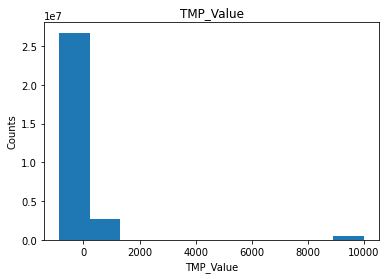

In [0]:
col_histogram(df_weather, "TMP_Value", 10)

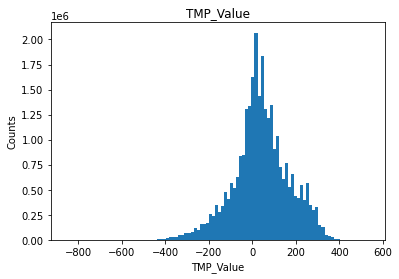

In [0]:
# temperature is scaled by 10
col_histogram(df_weather.filter("TMP_Value < 1000"), "TMP_Value", 100)

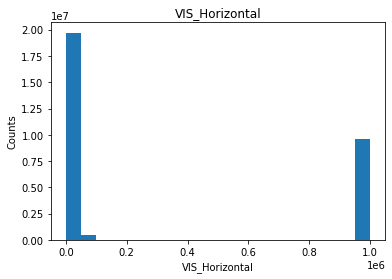

In [0]:
col_histogram(df_weather, "VIS_Horizontal", 20)

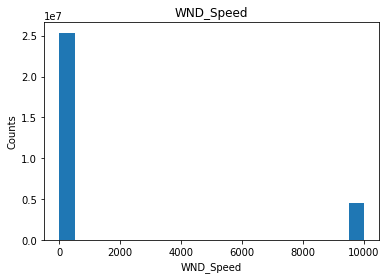

In [0]:
col_histogram(df_weather, "WND_Speed", 20)

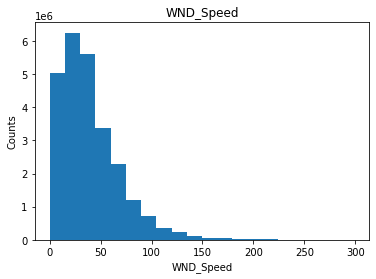

In [0]:
# wind speed is scaled by 10
col_histogram(df_weather.filter("WND_Speed < 300"), "WND_Speed", 20)

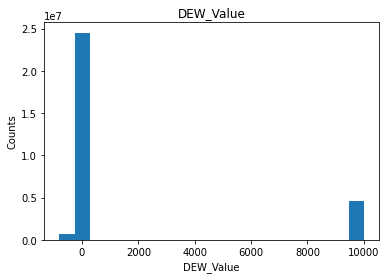

In [0]:
col_histogram(df_weather, "DEW_Value", 20)

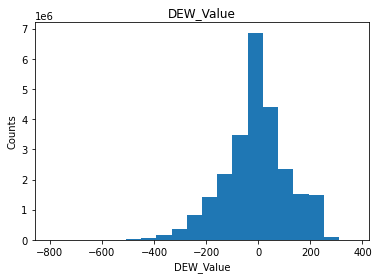

In [0]:
col_histogram(df_weather.filter("DEW_Value < 500"), "DEW_Value", 20)

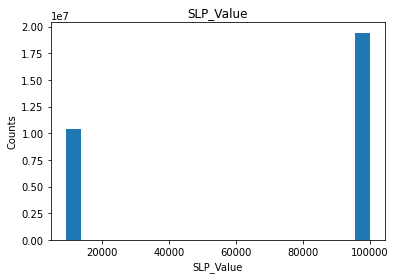

In [0]:
col_histogram(df_weather, "SLP_Value", 20)

## Flights EDA

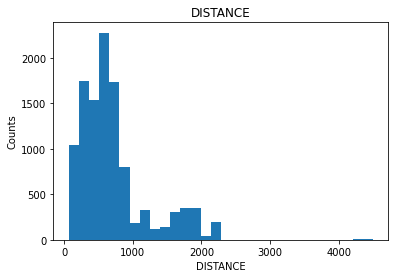

In [0]:
# distribution of flight distances for non-delayed flights
col_histogram(df_airlines.filter("DEP_DELAY = 0"), "DISTANCE", 30)

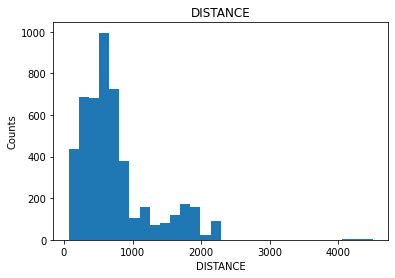

In [0]:
# distribution of flight distances for delayed flights
col_histogram(df_airlines.filter("DEP_DELAY = 1"), "DISTANCE", 30)

There doesn't look to be a difference in how far delayed flights are going.

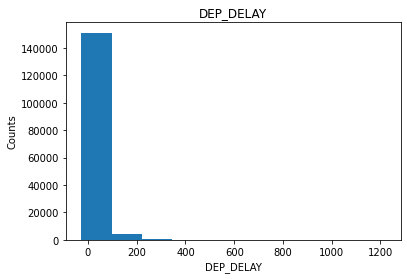

In [0]:
# distribution of delay times
col_histogram(df_airlines, "DEP_DELAY", 10)

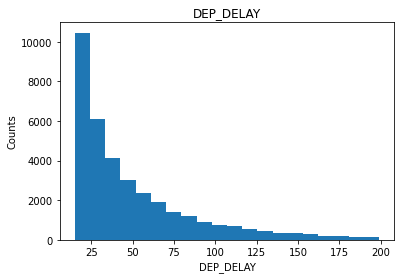

In [0]:
# filtering out the maximum outliers for delay times
col_histogram(df_airlines.filter("DEP_DEL15 = 1 AND DEP_DELAY < 200"), "DEP_DELAY", 20)

Most delays are short, 25 minutes or less.

In [0]:
# making sure that the CANCELLED and DIVERTED columns are binary
df_airlines.select("CANCELLED").distinct().show()
df_airlines.select("DIVERTED").distinct().show()

+---------+
CANCELLED|
+---------+
 0.0|
 1.0|
+---------+

+--------+
DIVERTED|
+--------+
 0.0|
 1.0|
+--------+

In [0]:
for _col in ["CANCELLED", "DIVERTED"]:
  # comparing number of cancelled/diverted flights in delayed and non-delayed groups
  cancelled_delayed = df_airlines.filter(f"DEP_DEL15 = 1 AND {_col} = 1").count()
  cancelled_ontime = df_airlines.filter(f"DEP_DEL15 = 0 AND {_col} = 1").count()
  print(f"{cancelled_delayed} delayed flights were {_col.lower()}, {cancelled_ontime} non-delayed flights were {_col.lower()}")

  # calculating percentage of delayed flights that were then cancelled/diverted
  print(f"{100 * (cancelled_delayed / df_airlines.filter('DEP_DEL15 = 1').count()):.2f}% of delayed flights were {_col.lower()}")

102 delayed flights were cancelled, 56 non-delayed flights were cancelled
0.28% of delayed flights were cancelled
128 delayed flights were diverted, 253 non-delayed flights were diverted
0.35% of delayed flights were diverted

0.28% of delayed flights were cancelled. There were only 158 cancelled flights in this dataset, and about 2/3 of those cancelled flights were also classified as delayed.

0.35% of delayed flights were diverted. There were 381 diverted flights in this dataset, and about 2/3 of those diverted flights were not delayed (upon departure, at least).

## Checking for Duplicates 
We check the aiport, weather and station data for duplicates. 

When checking airport data, we count a duplicate if the flight has the same flight path, departure time and tail number (aircraft identifier). No duplicates were found.

When checking station data, we count a duplicate if the station has the same station ID, co-ordinates and neighbor ID. No duplicates were found.

When checking weather data, we count a duplicate if the weather data has the same station and date - some duplicates were found but they had different report types

In [0]:
# Initial check for duplicates. There shouldn't be flights with the same flight number departing and the same time with the same flight path.
# We find 3 duplicates - all are cancelled flights so they get removed in the later EDA 
duplicate_cols = ["FL_DATE", 
                  "CRS_DEP_TIME", 
                  "DEST_AIRPORT_ID", "ORIGIN_AIRPORT_ID", "TAIL_NUM"]
display(df_temp.groupBy(*duplicate_cols).count().filter("count > 1"))
display(df_temp.filter("DEST_AIRPORT_ID = 10721 AND ORIGIN_AIRPORT_ID = 13930 AND FL_DATE = '2015-02-15' AND CRS_DEP_TIME = '800'"))
display(df_temp.filter("DEST_AIRPORT_ID = 12953 AND ORIGIN_AIRPORT_ID = 13930 AND FL_DATE = '2015-01-27' AND CRS_DEP_TIME = '1500'"))
display(df_temp.filter("DEST_AIRPORT_ID = 14100 AND ORIGIN_AIRPORT_ID = 13930 AND FL_DATE = '2015-03-05' AND CRS_DEP_TIME = '600'"))

FL_DATE,CRS_DEP_TIME,DEST_AIRPORT_ID,ORIGIN_AIRPORT_ID,TAIL_NUM,count
2015-02-15,800,10721,13930,null,2
2015-01-27,1500,12953,13930,null,2
2015-03-05,600,14100,13930,null,2


ACTUAL_ELAPSED_TIME,AIR_TIME,ARR_DEL15,ARR_DELAY,ARR_DELAY_GROUP,ARR_DELAY_NEW,ARR_TIME,ARR_TIME_BLK,CANCELLATION_CODE,CANCELLED,CARRIER_DELAY,CRS_ARR_TIME,CRS_DEP_TIME,CRS_ELAPSED_TIME,DAY_OF_MONTH,DAY_OF_WEEK,DEP_DEL15,DEP_DELAY,DEP_DELAY_GROUP,DEP_DELAY_NEW,DEP_TIME,DEP_TIME_BLK,DEST,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,DISTANCE,DISTANCE_GROUP,DIVERTED,FIRST_DEP_TIME,FL_DATE,LATE_AIRCRAFT_DELAY,LONGEST_ADD_GTIME,MONTH,NAS_DELAY,OP_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER_FL_NUM,OP_UNIQUE_CARRIER,ORIGIN,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,QUARTER,SECURITY_DELAY,TAIL_NUM,TAXI_IN,TAXI_OUT,TOTAL_ADD_GTIME,WEATHER_DELAY,WHEELS_OFF,WHEELS_ON,YEAR
null,null,null,null,null,null,null,1100-1159,B,1.0,null,1110,800,130.0,15,7,null,null,null,null,null,0800-0859,BOS,10721,1072102,30721,"Boston, MA",MA,25,Massachusetts,13,867.0,4,0.0,null,2015-02-15,null,null,2,null,AA,19805,1373,AA,ORD,13930,1393003,30977,"Chicago, IL",IL,17,Illinois,41,1,null,null,null,null,null,null,null,null,2015
null,null,null,null,null,null,null,1100-1159,B,1.0,null,1117,800,137.0,15,7,null,null,null,null,null,0800-0859,BOS,10721,1072102,30721,"Boston, MA",MA,25,Massachusetts,13,867.0,4,0.0,null,2015-02-15,null,null,2,null,UA,19977,1439,UA,ORD,13930,1393003,30977,"Chicago, IL",IL,17,Illinois,41,1,null,null,null,null,null,null,null,null,2015


ACTUAL_ELAPSED_TIME,AIR_TIME,ARR_DEL15,ARR_DELAY,ARR_DELAY_GROUP,ARR_DELAY_NEW,ARR_TIME,ARR_TIME_BLK,CANCELLATION_CODE,CANCELLED,CARRIER_DELAY,CRS_ARR_TIME,CRS_DEP_TIME,CRS_ELAPSED_TIME,DAY_OF_MONTH,DAY_OF_WEEK,DEP_DEL15,DEP_DELAY,DEP_DELAY_GROUP,DEP_DELAY_NEW,DEP_TIME,DEP_TIME_BLK,DEST,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,DISTANCE,DISTANCE_GROUP,DIVERTED,FIRST_DEP_TIME,FL_DATE,LATE_AIRCRAFT_DELAY,LONGEST_ADD_GTIME,MONTH,NAS_DELAY,OP_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER_FL_NUM,OP_UNIQUE_CARRIER,ORIGIN,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,QUARTER,SECURITY_DELAY,TAIL_NUM,TAXI_IN,TAXI_OUT,TOTAL_ADD_GTIME,WEATHER_DELAY,WHEELS_OFF,WHEELS_ON,YEAR
null,null,null,null,null,null,null,1800-1859,B,1.0,null,1807,1500,127.0,27,2,null,null,null,null,null,1500-1559,LGA,12953,1295302,31703,"New York, NY",NY,36,New York,22,733.0,3,0.0,null,2015-01-27,null,null,1,null,UA,19977,686,UA,ORD,13930,1393003,30977,"Chicago, IL",IL,17,Illinois,41,1,null,null,null,null,null,null,null,null,2015
null,null,null,null,null,null,null,1800-1859,B,1.0,null,1802,1500,122.0,27,2,null,null,null,null,null,1500-1559,LGA,12953,1295302,31703,"New York, NY",NY,36,New York,22,733.0,3,0.0,null,2015-01-27,null,null,1,null,AA,19805,364,AA,ORD,13930,1393003,30977,"Chicago, IL",IL,17,Illinois,41,1,null,null,null,null,null,null,null,null,2015


ACTUAL_ELAPSED_TIME,AIR_TIME,ARR_DEL15,ARR_DELAY,ARR_DELAY_GROUP,ARR_DELAY_NEW,ARR_TIME,ARR_TIME_BLK,CANCELLATION_CODE,CANCELLED,CARRIER_DELAY,CRS_ARR_TIME,CRS_DEP_TIME,CRS_ELAPSED_TIME,DAY_OF_MONTH,DAY_OF_WEEK,DEP_DEL15,DEP_DELAY,DEP_DELAY_GROUP,DEP_DELAY_NEW,DEP_TIME,DEP_TIME_BLK,DEST,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,DISTANCE,DISTANCE_GROUP,DIVERTED,FIRST_DEP_TIME,FL_DATE,LATE_AIRCRAFT_DELAY,LONGEST_ADD_GTIME,MONTH,NAS_DELAY,OP_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER_FL_NUM,OP_UNIQUE_CARRIER,ORIGIN,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,QUARTER,SECURITY_DELAY,TAIL_NUM,TAXI_IN,TAXI_OUT,TOTAL_ADD_GTIME,WEATHER_DELAY,WHEELS_OFF,WHEELS_ON,YEAR
null,null,null,null,null,null,null,0900-0959,B,1.0,null,907,600,127.0,5,4,null,null,null,null,null,0600-0659,PHL,14100,1410002,34100,"Philadelphia, PA",PA,42,Pennsylvania,23,678.0,3,0.0,null,2015-03-05,null,null,3,null,UA,19977,422,UA,ORD,13930,1393003,30977,"Chicago, IL",IL,17,Illinois,41,1,null,null,null,null,null,null,null,null,2015
null,null,null,null,null,null,null,0900-0959,B,1.0,null,905,600,125.0,5,4,null,null,null,null,null,0600-0659,PHL,14100,1410002,34100,"Philadelphia, PA",PA,42,Pennsylvania,23,678.0,3,0.0,null,2015-03-05,null,null,3,null,US,20355,1896,US,ORD,13930,1393003,30977,"Chicago, IL",IL,17,Illinois,41,1,null,null,null,null,null,null,null,null,2015


In [0]:
# Checkng duplicates in the station data 
duplicate_station_cols = ['station_id', 'lon', 'lat', 'neighbor_id']
display(df_stations.groupBy(*duplicate_station_cols).count().filter("count > 1"))

station_id,lon,lat,neighbor_id,count


In [0]:
duplicate_weather_cols = ['STATION', 'DATE']
display(df_weather.groupBy(*duplicate_weather_cols).count().filter('count > 1'))


STATION,DATE,count
67005099999,2015-01-03T12:00:00.000+0000,2
67005099999,2015-02-15T03:00:00.000+0000,2
67005099999,2015-03-07T03:00:00.000+0000,2
67009099999,2015-02-08T03:00:00.000+0000,2
67009099999,2015-03-21T15:00:00.000+0000,2
67012099999,2015-01-17T15:00:00.000+0000,2
67012099999,2015-01-31T06:00:00.000+0000,2
67012099999,2015-03-18T15:00:00.000+0000,2
67027099999,2015-01-11T18:00:00.000+0000,2
67027099999,2015-02-13T12:00:00.000+0000,2


In [0]:
display(df_weather.filter("STATION = 67005099999 AND DATE = '2015-01-03T12:00:00.000+0000'"))

# Two different report types:
# FM-12 = SYNOP Report of surface observation form a fixed land station
# FM-15 = METAR Aviation routine weather report